In [1]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#Results generated from run_kraken2.py

#Read in dataframe containing the results
df=pd.read_csv('/storage/stefan/new_origins_kraken2db/simulated_reads/communities/community_analysis.csv', sep=',')

#Drop NAs, this is for Pseudochrobactrum asaccharolyticum and Kluyvera cryocrescens who have no complete genomes and 
#are thus excluded from the database
df.dropna(axis=0, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 70 entries, 0 to 89
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Community  70 non-null     object 
 1   Species    70 non-null     object 
 2   TP         70 non-null     float64
 3   FP         70 non-null     float64
 4   TN         70 non-null     float64
 5   FN         70 non-null     float64
 6   Precision  70 non-null     float64
 7   Recall     70 non-null     float64
 8   FPR        70 non-null     float64
dtypes: float64(7), object(2)
memory usage: 5.5+ KB


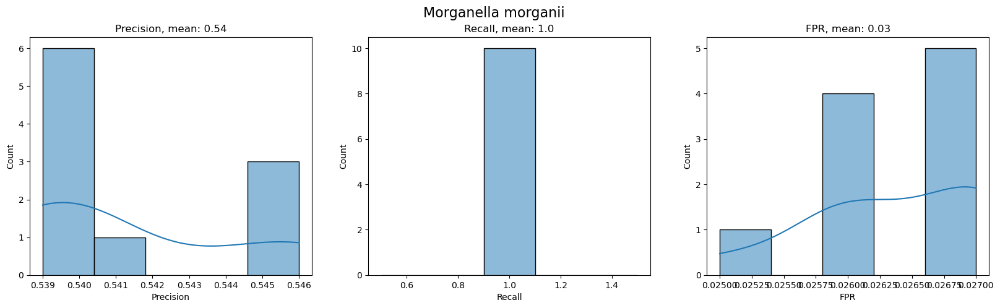

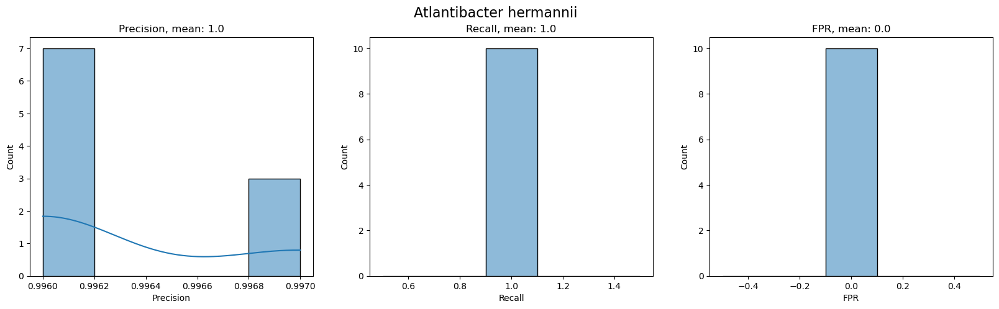

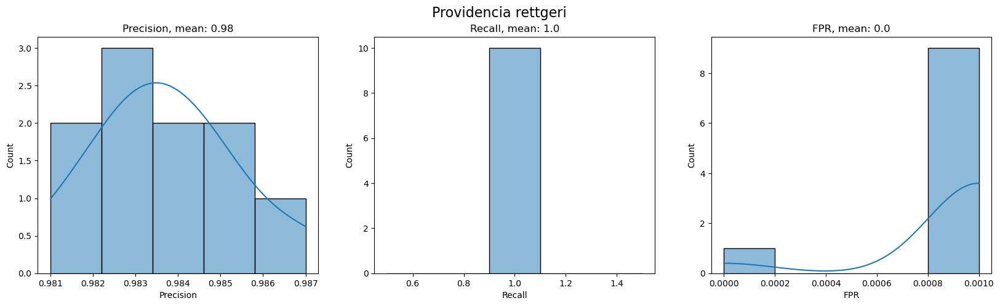

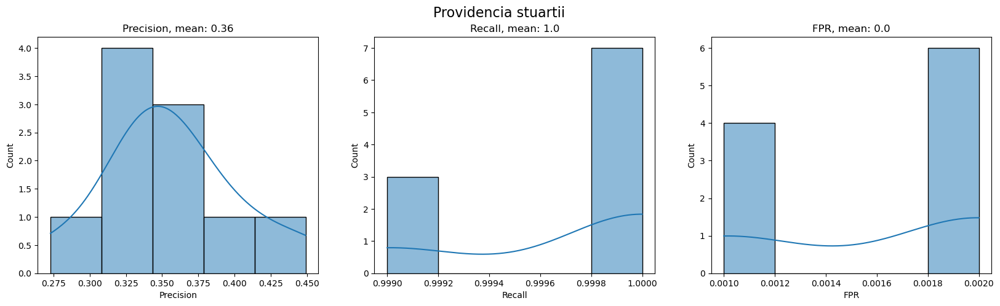

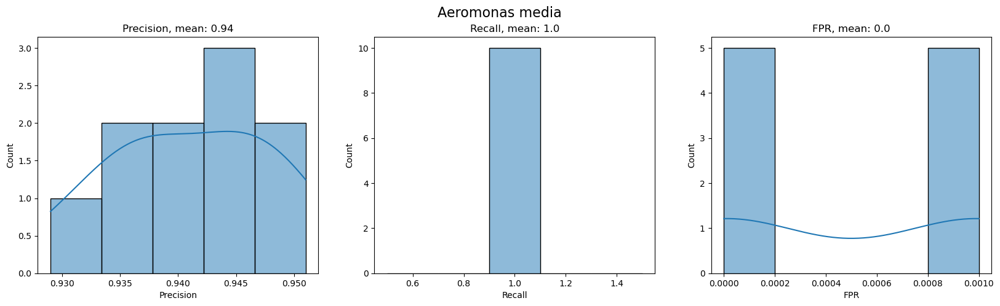

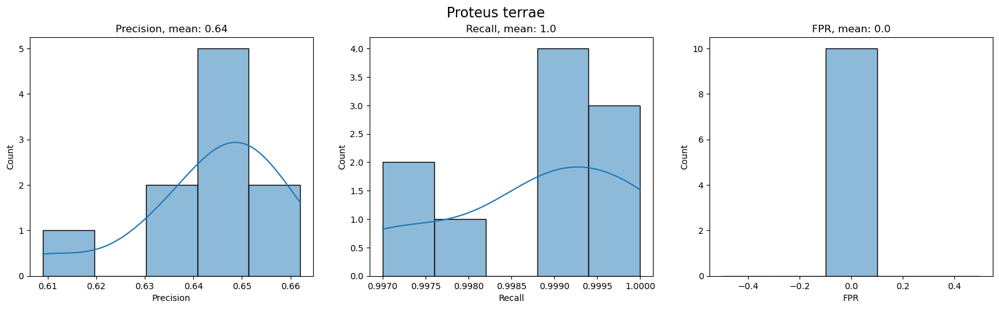

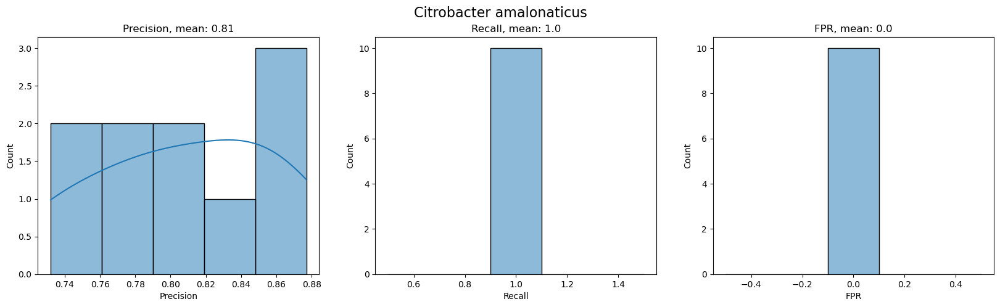

In [3]:
#Plot distribution of mectrics for each origin species
metrics=['Precision', 'Recall', 'FPR']

for spec in list(df['Species'].unique()):
    spec_df=df[df['Species']==spec]

    fig, axes = plt.subplots(1, 3, figsize=[20, 5])
    fig.suptitle(spec, fontsize=16)

    for ax, c in zip(axes.flatten(), metrics):
        axi=sns.histplot(spec_df[c], kde=True, ax=ax, bins=5)
        axi.set_title(f'{c}, mean: {round(np.mean(spec_df[c]), 2)}')



The above histograms show good precision for all species except M. morganii, P. stuartii and P. terrae. To try and improve the capabilities of our database, we have to find out which species are commonly cause for the misclassifications of the origin species. For that, we check the kraken2 output files.

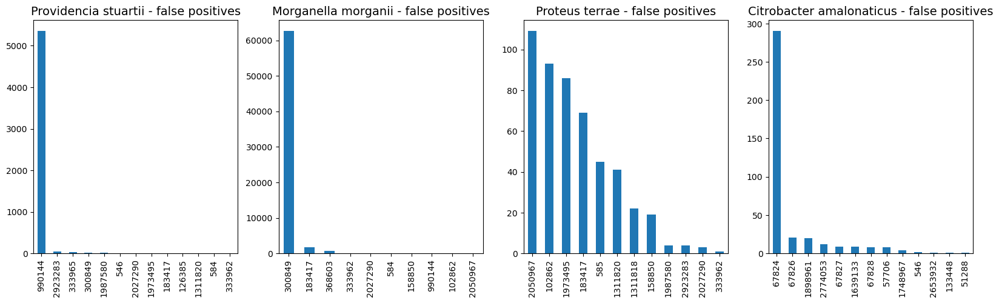

In [4]:
origins=[('Providencia stuartii','588'), ('Morganella morganii', '582'), ('Proteus terrae','1574161'), ('Citrobacter amalonaticus', '35703')]
lines=[l for l in open('/storage/stefan/new_origins_kraken2db/simulated_reads/communities/community0/kraken2_out.txt', 'r')]

#For each origin, get false positive reads and plot amount of misclassifications per taxid
fig, axes=plt.subplots(1, 4, figsize=[20, 5])

for ax, o in zip(axes.flatten(), origins):
    fp=[str(l.split('\t')[1].split('|')[2].split('-')[0]) for l in lines if ' '.join(l.split('\t')[2].split(' ')[:2])==o[0] and not \
        str(l.split('\t')[1].split('|')[2].split('-')[0])==o[1]]
    axi=pd.Series(fp).value_counts().plot(kind='bar', ax=ax)
    axi.set_title(f'{o[0]} - false positives', fontsize=14)
    
    

We see that Providencia stuartii gets mixed up with Providencia thailandensis - by gANI, the two species ar indistinguishable, so we will treat them as the same species in our manuscript.
Morganella morganii is mostly being mixed up with an uncultured Morganella sp. - likely M. morganii, so this will simply be removed from the reads file. Also a bit with Proteus hauseri and M. psychrotolerans, but thats more neglegible. 
Proteus terrae seems to have several problems - small amount of reads + misclassifications as 1. Proteus faecis 2. Proteus penneri 3. Proteus alimentorum 4. Proteus hauseri 5. Proteus vulgaris 6. Proteus genomosp. 6, 7. Proteus genomosp. 4, 8. Providencia rustigianii - Remove genomosp. genomes and check if the other proteus sp. are in the database
Citrobacter amalonaticus gets mixed up with C. farmeri (which is genetically close) and to a small extent with C. sedlakii

NOTE: The different amounts of reads are of course because of the different numbers of complete genomes available for the origin species - e.g for P. terrae, only one genome has been excluded from the database creation and included into the mock communities, for e.g M. morganii >=3 genomes are included in the reads

To do: Remove 'uncultured', 'unclassified', 'genomosp.' and so on from the read files, as their taxonomy is unclear. Remove Providencia thailandensis from kraken2 database so the P. thailandensis genomes get matched to P. stuartii. Check if P. terrae related Proteus species are in reference database

Also focus on FPR as a metric - create reads from communities WITHOUT the origin species
Fanny classified TN as all reads classified at bacterial level within one test community (e.g Citrobacter for testing C. freundii and so on)

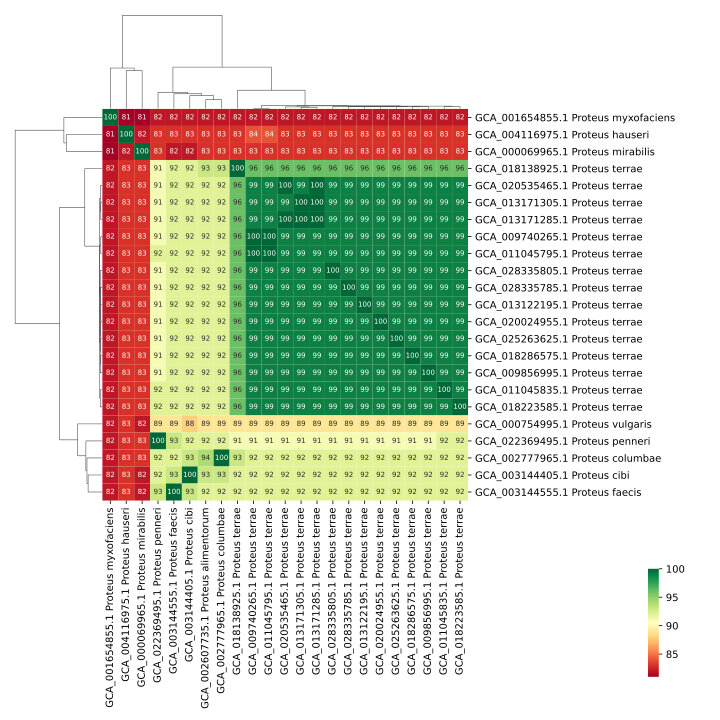

In [5]:
#Check the ganis between the Proteus genomes
from IPython.core.display import SVG
SVG(filename='/storage/stefan/proteus_gani_analysis/gani_heatmap.svg')

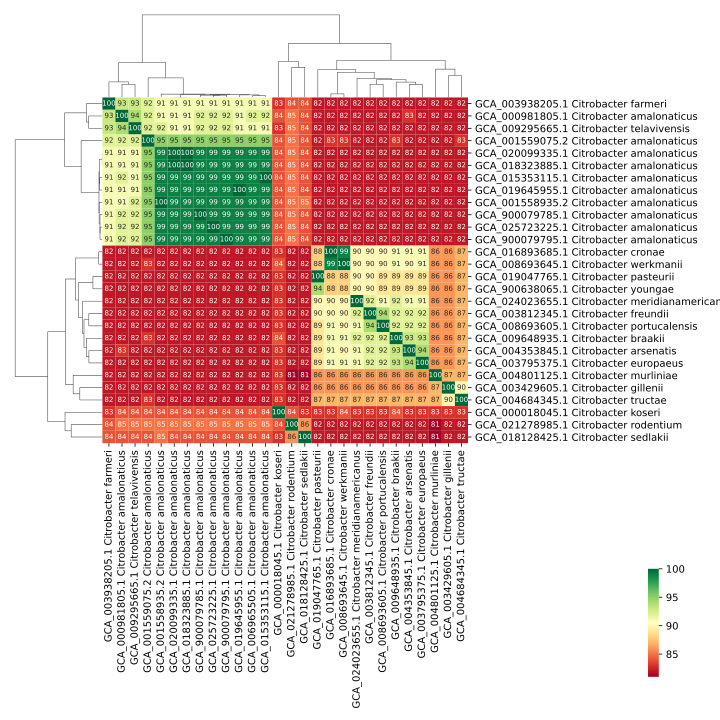

In [6]:
SVG(filename='/storage/stefan/citrobacter_gani_analysis/gani_heatmap.svg')

The above figure shows that the Proteus species are similar, but not too much so. In order to improve the classification, we can 
1. Remove the P. terrae genome that is dissimilar from the others (GCA_018138925.1)
2. add more genomes for the closely related species - these have to be complete genomes and the taxonomy check must be okay

For Citrobacter amalonaticus:
1. Remove genomes that are dissimilar to majority of C. amalonaticus genomes from kraken2_db (GCA_000981805.1, GCA_001559075.2)
2. Add more genomes for C. farmeri and C. sedlakii

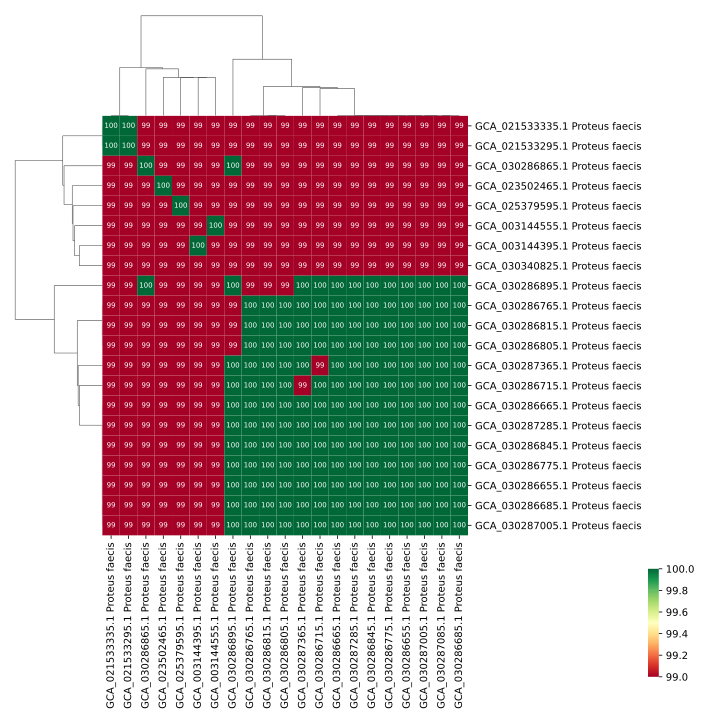

In [7]:
#Proteus faecis
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/proteus_faecis/gani_heatmap.svg')
#Reference: GCA_030286765.1 Add: GCA_003144555.1, GCA_030286655.1

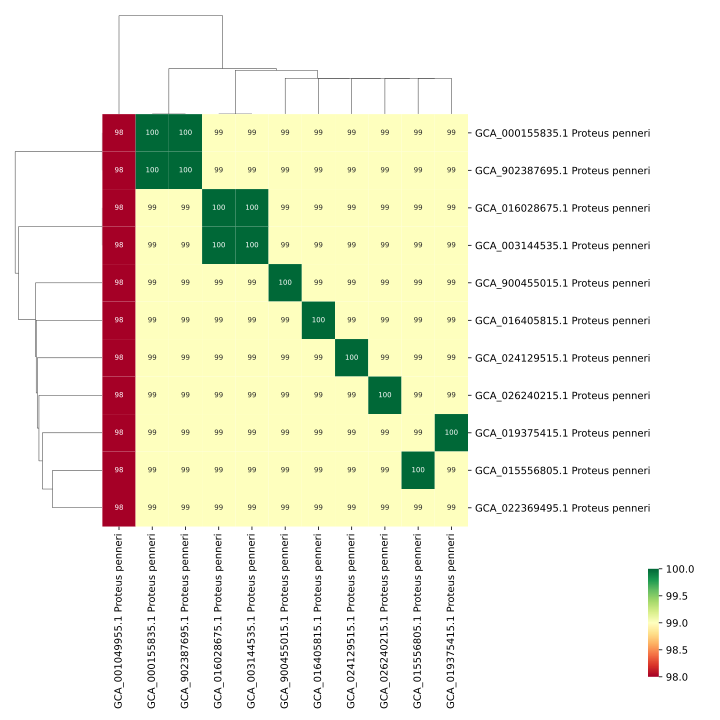

In [8]:
#Proteus penneri
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/proteus_penneri/gani_heatmap.svg')
#Reference: GCA_022369495.1, Add: GCA_019375415.1, GCA_001049955.1

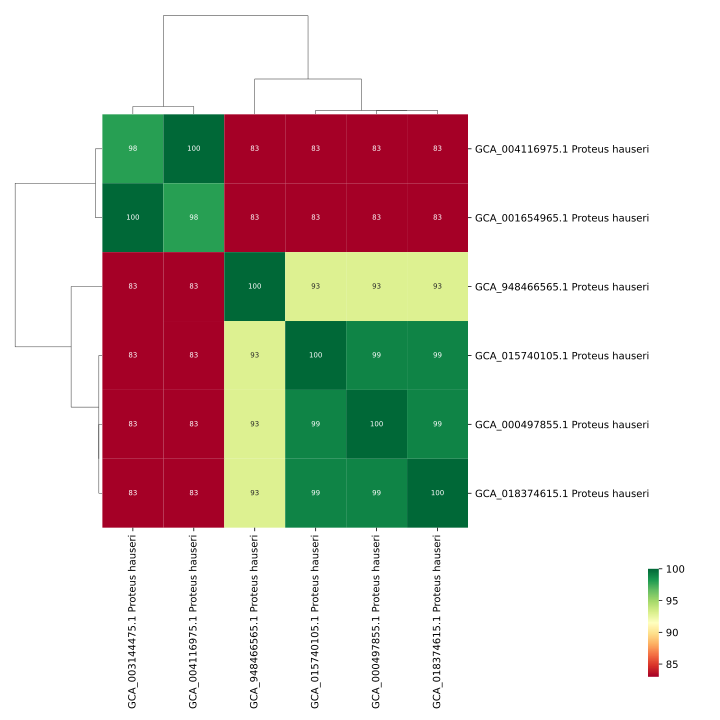

In [9]:
#Proteus hauseri
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/proteus_hauseri/gani_heatmap.svg')
#Reference: GCA_004116975.1, Add: GCA_003144475.1


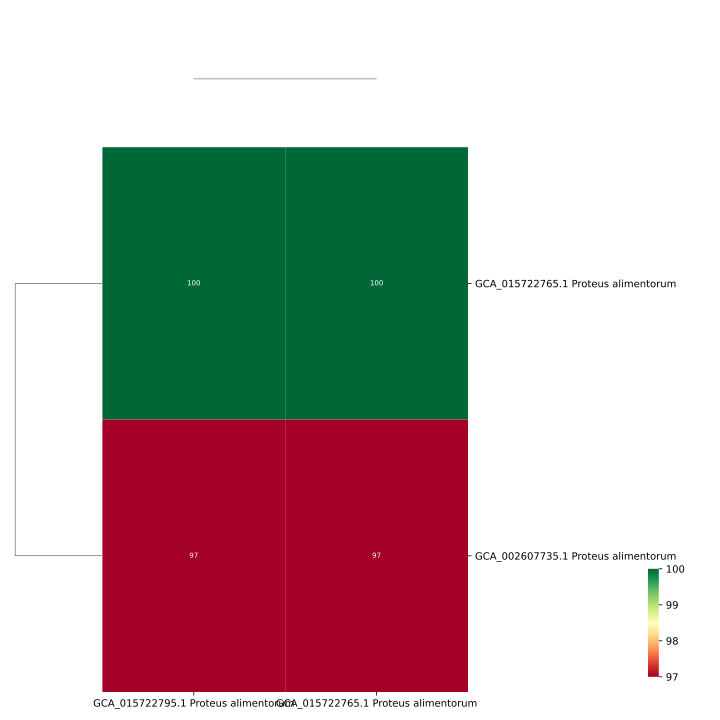

In [10]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/proteus_alimentorum/gani_heatmap.svg')
#Reference: GCA_002607735.1, Add: GCA_015722795.1, GCA_015722765.1

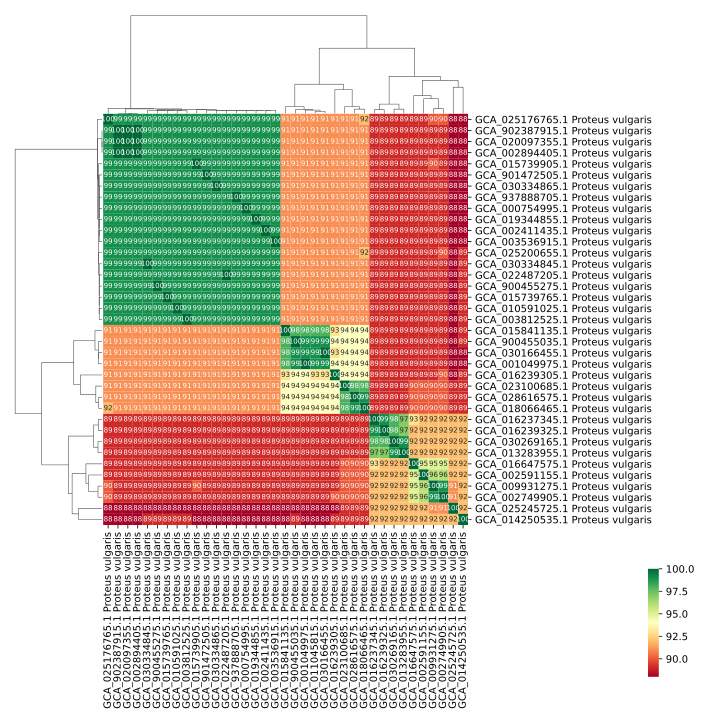

In [11]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/proteus_vulgaris/gani_heatmap.svg')
#Reference: GCA_000754995.1, Add: GCA_025176765.1, GCA_902387915.1

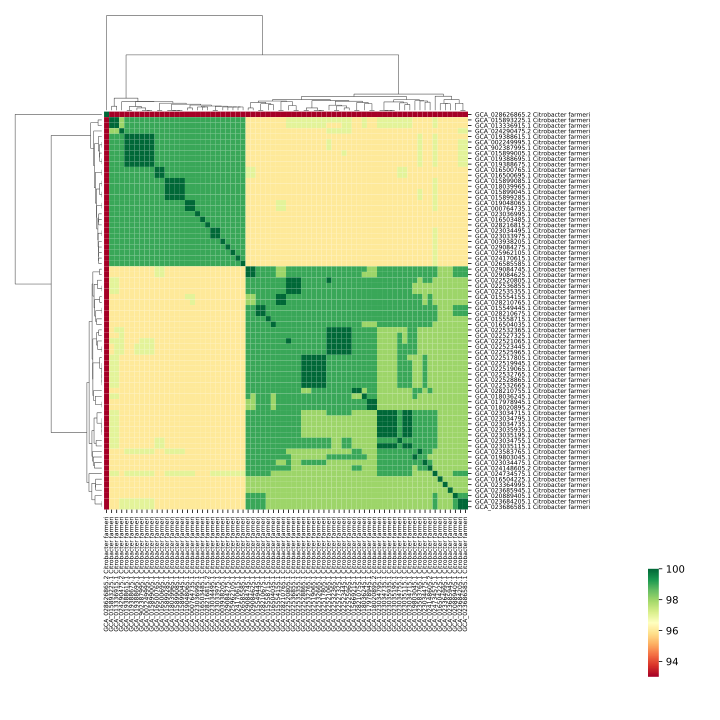

In [12]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/citrobacter_farmeri/gani_heatmap.svg')
#Reference: GCA_003938205.1, Add: GCA_015893225.1, GCA_000764735.1

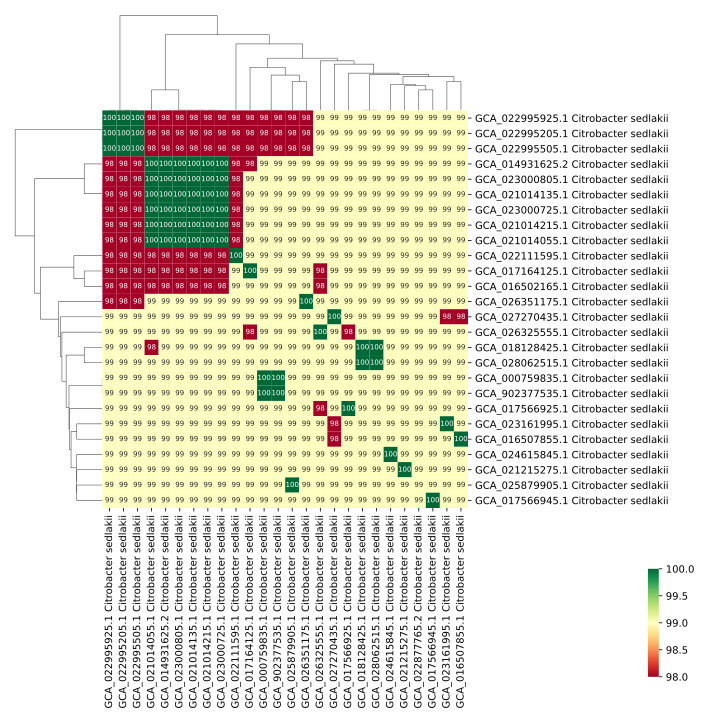

In [13]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/citrobacter_sedlakii/gani_heatmap.svg')
#Reference: GCA_018128425.1, Add: GCA_021014055.1, GCA_026351175.1

Using the heatmaps, the following genomes were chosen to add to the origin database in order to increase resolution on closely related species:

GCA_021014055.1
GCA_026351175.1
GCA_015893225.1
GCA_000764735.1
GCA_025176765.1
GCA_902387915.1
GCA_015722795.1
GCA_015722765.1
GCA_003144475.1
GCA_019375415.1
GCA_001049955.1
GCA_003144555.1
GCA_030286655.1

There is also considerable variance within Proteus species, therefore we have to check whether some genomes that we use during testing are falsely classified as P. hauseri, when they actually are P. terrae.

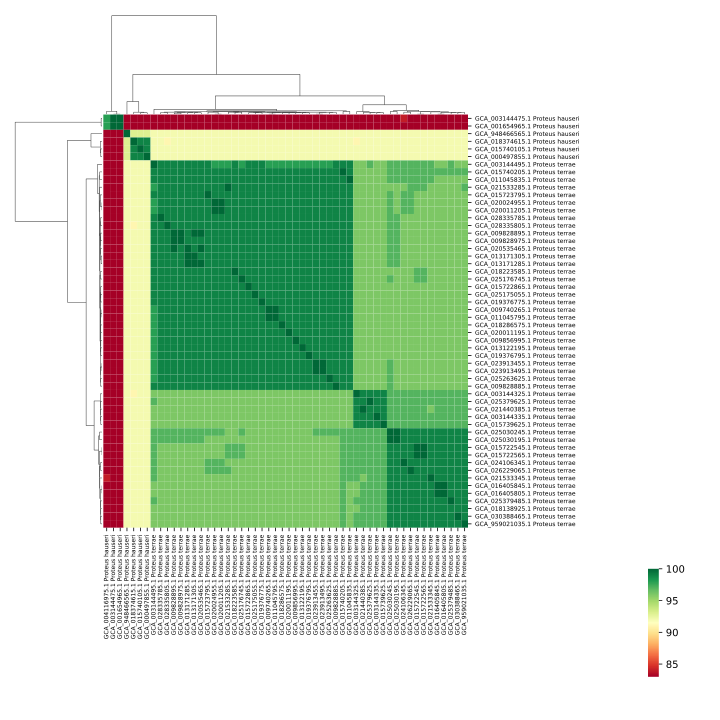

In [14]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/terrae_hauseri/gani_heatmap.svg')

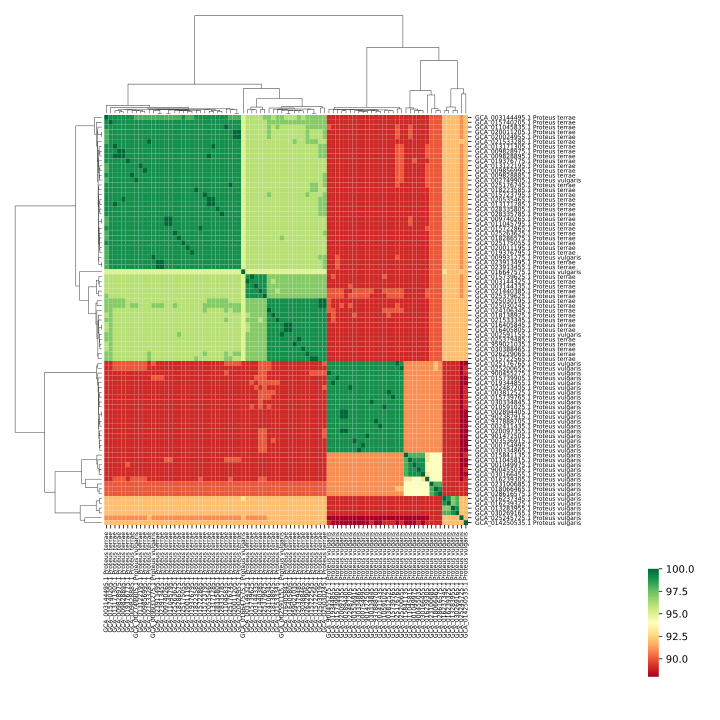

In [15]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/vulgaris_terrae/gani_heatmap.svg')

The above figures show no missclassification between P. hauseri and P. terrae, but some P. vulgaris appear to be misclassified as P. terrae (GCA_002591155.1, GCA_016647575.1, GCA_009931275.1, GCA_002749905.1), so exclude these when filtering the closely related species (all filtering is done in 'convert_headers_to_kraken2.py')

So the workflow to build the new database will now be

1. add the origin genomes, excluding the ones mentioned above and excluding P. thailandensis from database (removed in both closely related genomes and standard bacterial database):
kraken2-build --add-to-library /storage/stefan/new_origins_august23/origin_genomes/sampled/all_origin_genomes.fna.filtered.fna.kraken2_headers.fna --db origin_db_test2

2. add the reference genomes for the species closely related to the origin species, excluding P. thailandensis:
kraken2-build --add-to-library /storage/stefan/new_origins_august23/origin_genus_genomes/all_origin_genus_genomes.fna.filtered.fna.kraken2_headers.fna --db origin_db_test2

2.1 add additional genomes for closely related species
2.1.1 kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/additional_genomes/genomes/all_additional_genomes.fna.filtered.fna.kraken2_headers.fna --db origin_db_test2

3. add bacteria base library to database:
kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_bacteria/library.fna.origins_filtered.fna --db origin_db_test2

4. add plasmids, human genome, univec and viral references to database
4.1: kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_human/baselib/library.fna --db origin_db_test2 
4.2: kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_viral/baselib/viral_genomes_ref.fna --db origin_db_test2
4.3: kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_univec/baselib/library.fna --db origin_db_test2 

5. Create mock community - 5 communities per origin, containing 1 random genome per closely related species but NOT the origin

python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/generate_mock_communities.py --asm /storage/stefan/new_origins_august23/assembly_summary_aug23/assembly_summary.txt --n_genomes 1 --n_samples 5 --out_dir /storage/stefan/new_origins_kraken2db/simulated_reads/genus_communities2/ --genus_only 

6. calculate classification metrics - FPR only for genus communities

'python run_kraken2_genus_metrics.py --kraken_db /storage/stefan/new_origins_kraken2db/origin_db_test --out_dir /storage/stefan/new_origins_kraken2db/simulated_reads/mock_coms_test/genus_only/communities/ --threads 40 --analyse_only --asms /storage/stefan/new_origins_august23/assembly_summary_aug23/assembly_summary.txt --analyse_multiple /storage/stefan/new_origins_kraken2db/simulated_reads/mock_coms_test/genus_only/communities/'

The results of this new test are found below - we focussed exclusively on the FPR in absence of origin species now

In [16]:
df2=pd.read_csv('/storage/stefan/new_origins_kraken2db/simulated_reads/genus_communities/community_analysis.csv', sep=',')

#drop na
df2.dropna(inplace=True)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40 entries, 0 to 44
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Community            40 non-null     object 
 1   Species              40 non-null     object 
 2   FP                   40 non-null     float64
 3   total_species_reads  40 non-null     float64
 4   FPR                  40 non-null     float64
dtypes: float64(3), object(2)
memory usage: 1.9+ KB


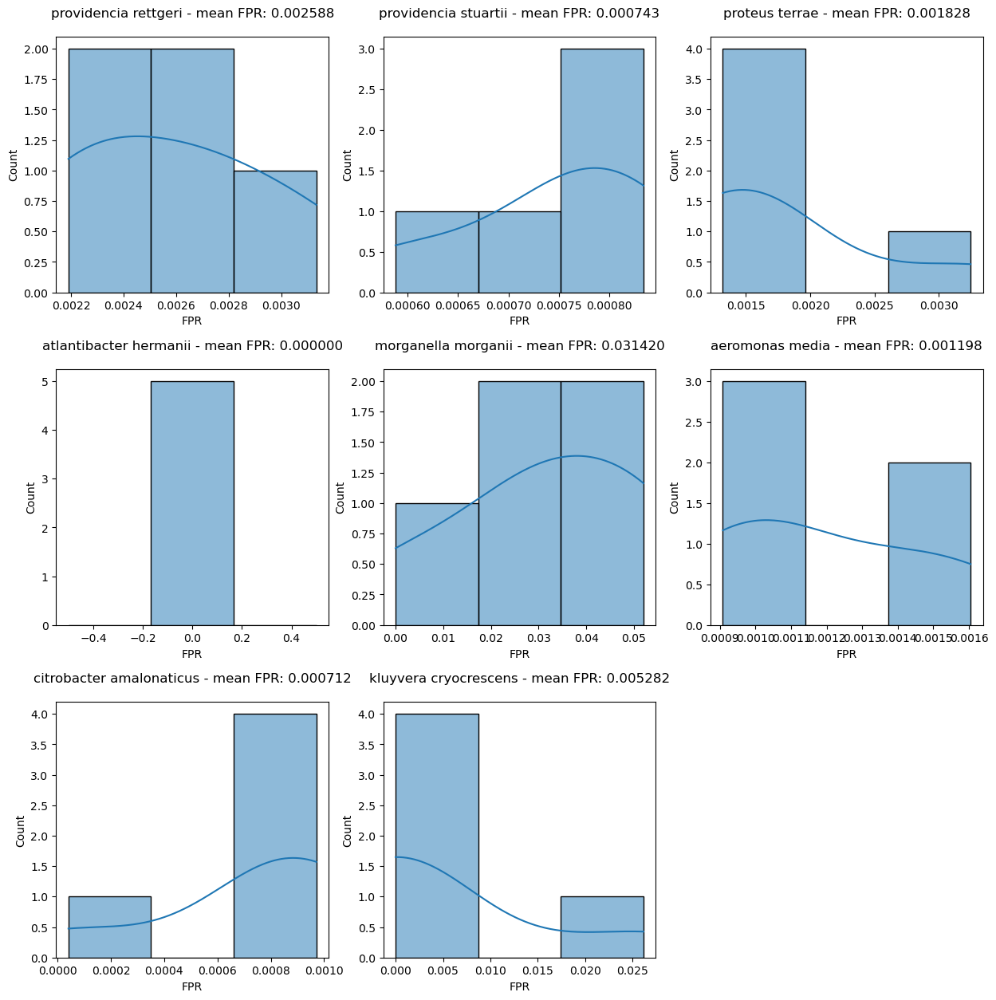

In [17]:
specs=list(df2['Species'].unique())

fig, axes = plt.subplots(3, 3, figsize=[15,15])
fig.subplots_adjust(hspace=0.3)

for ax, s in zip(axes.flatten(), specs):
    specdf=df2[df2['Species']==s]
    axi=sns.histplot(specdf['FPR'], kde=True, ax=ax, bins=3)
    axi.set_title(f'{s} - mean FPR: {np.mean(specdf["FPR"]):.6f}', y=1.05)

fig.delaxes(axes[2][2])

FPR is highest for Morganella morganii - check gANI of all M. psychrotolerans genomes against the M. morganii reference

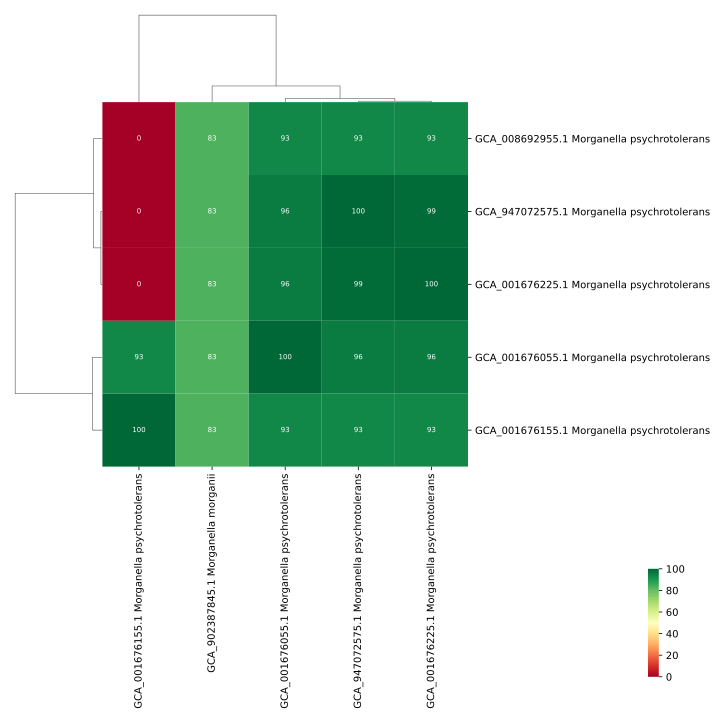

In [18]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/morganella_psychrotolerans/genomes/gani_heatmap.svg')

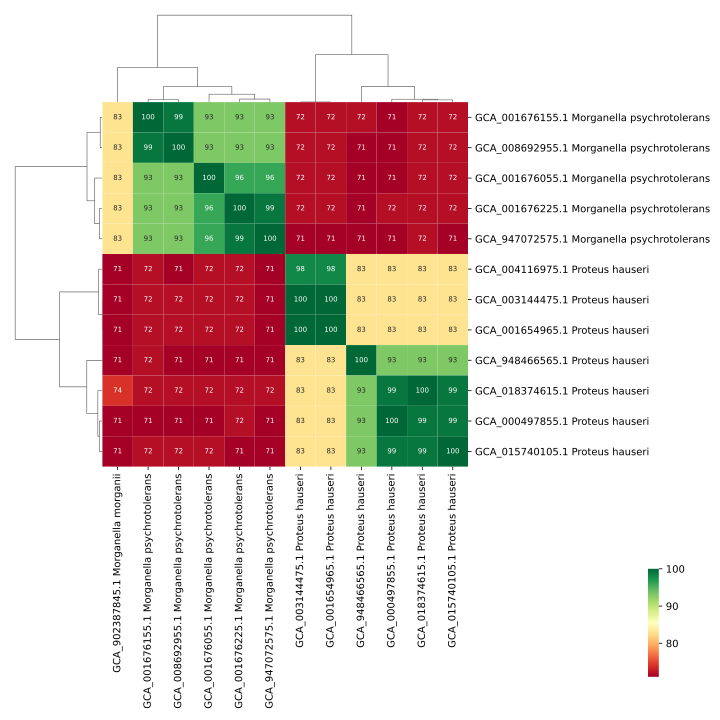

In [19]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/morganii_hauserii/gani_heatmap.svg')

Pseudochrobactrum has not been included in the database, create new database with pseudochrobactrum asaccharolyticum and closely related species included. This time, add ALL origin genomes to the database

To do: Redo file with all origin genera, make sure everything is included, redo origin file to contain all origins
origin genera: /storage/stefan/new_origins_august23/origin_genus_genomes/september23/genomes/all_origin_genus_genomes.fna.kraken2_headers.fna
origin genomes: 


1. Add bacterial standard db:
kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_bacteria/library.fna --db origin_db_test3 

1.2 Add origin genera
kraken2-build --add-to-library /storage/stefan/new_origins_august23/origin_genus_genomes/september23/genomes/all_origin_genus_genomes.fna.kraken2_headers.fna --db origin_db_test3

1.3 Add origin species genomes
kraken2-build --add-to-library /storage/stefan/new_origins_august23/origin_genomes/all_origin_genomes.fna.filtered.fna.kraken2_headers.fna --db origin_db_test3

1.4 Add univec, human ref, viral ref databases
kraken2-build --add-to-library /storage/stefan/new_origins_august23/ncbi_plasmids/ncbi_plasmids_renamed.fna --db origin_db_test3
kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_univec/baselib/library.fna --db origin_db_test3 
kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_viral/baselib/viral_genomes_ref.fna --db origin_db_test3
kraken2-build --add-to-library /storage/stefan/new_origins_kraken2db/baselib_human/baselib/library.fna --db origin_db_test3

2. Generate new mock communities
 python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/generate_mock_communities.py --asm /storage/stefan/new_origins_august23/assembly_summary_aug23/assembly_summary.txt --n_genomes 1 --n_samples 5 --out_dir /storage/stefan/new_origins_kraken2db/simulated_reads/genus_communities2/ --genus_only

3. Obtain new FDR estimates

4. Run against metagenomes




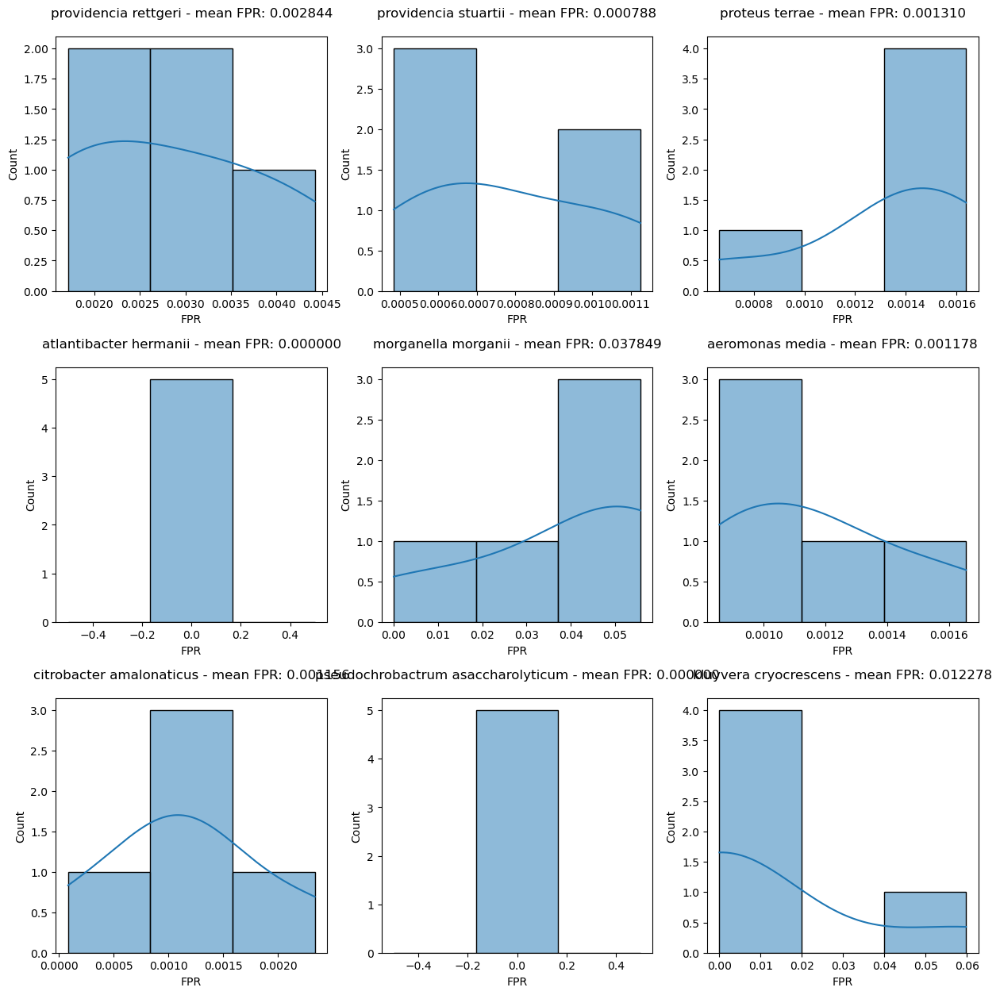

In [20]:
df3=pd.read_csv('/storage/stefan/new_origins_kraken2db/simulated_reads/genus_communities2/community_analysis.csv', sep=',')

#drop na
df3.dropna(inplace=True)

specs=list(df3['Species'].unique())

fig, axes = plt.subplots(3, 3, figsize=[15,15])
fig.subplots_adjust(hspace=0.3)

for ax, s in zip(axes.flatten(), specs):
    specdf=df3[df3['Species']==s]
    axi=sns.histplot(specdf['FPR'], kde=True, ax=ax, bins=3)
    axi.set_title(f'{s} - mean FPR: {np.mean(specdf["FPR"]):.6f}', y=1.05)


Atlantibacter and Pseudochrobactrum asaccharolyticum have a FPR of 0, which is suspicious. Calculate Ganis and visualize. For Pseudochrobactrum, also include Ochrobactrum (as at least some genomes seem very closely related).

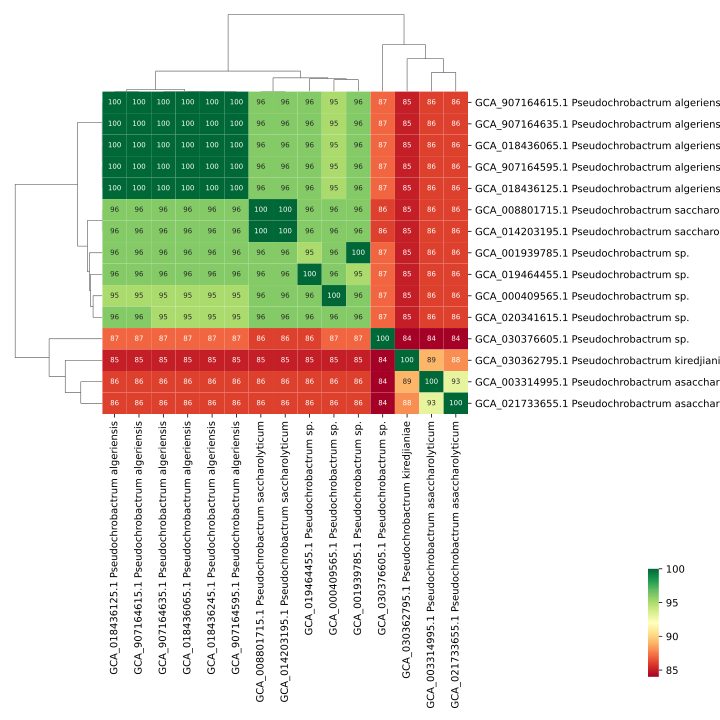

In [21]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/pseudochrobactrum/gani_heatmap.svg')

The P. asaccharolyticum reference strain (GCA_021733655.1, which is in the database) is not closely related to any other Pseudochrobactrum species, so a FPR of 0 may be possible.

In [22]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/ochrobactrum_pseudobactrum/gani_heatmap.svg')

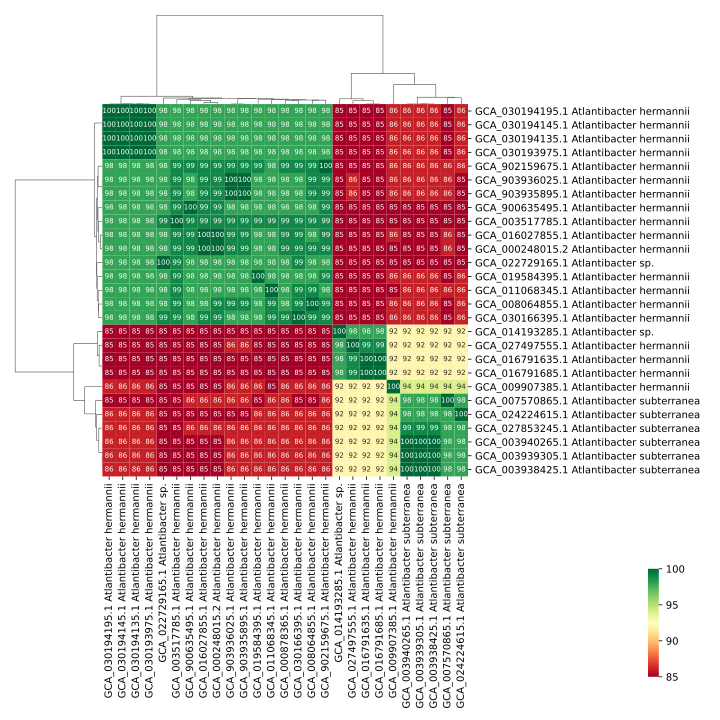

In [23]:
SVG(filename='/storage/stefan/new_origins_kraken2db/additional_genomes/gani_analysis/atlantibacter/gani_heatmap.svg')

Now we run some metagenomes against the database

1. Human Microbiome Project Healthy Human Subjects, feacal samples
@saga: python /home/stefan/postdoc/scripts/wgs_origins/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/HMP/paired_reads/ /storage/stefan/new_origins_kraken2db/origin_db_test3/

2. Global Sewage Project, all 2018 samples
Novermber 2018 samples:
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/shared/metagenomes/global_sewage/PRJEB40798/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/global_sewage_PRJEB40798

June2018 samples:
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/shared/metagenomes/global_sewage/PRJEB40816/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/global_sewage_PRJEB40816

3. Pig_and_Poultry metagenome PRJEB22062 
@saga: python /home/stefan/postdoc/scripts/wgs_origins/metagenome_scripts/run_kraken2_metagenomes.py /storage/shared/metagenomes/pig_and_poultry/paired_end /storage/stefan/new_origins_kraken2db/origin_db_test3/  

4. Pune river (antibiotic polluted) MGRAST19878 - metadata not found, ask Fanny
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/pune/paired_reads/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/pune

5. Cow feces PRJNA485488
@atropos: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/bovine_fecal/paired_end/decompressed/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/bovine_fecal/

6. Agriculture soil PRJEB22376
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/finish_agriculture_soil/paired_end/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/finish_agriculture_soil/ 

7. Forest soil PRJEB8420
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/forest_soil/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/forest_soil/

8. Daisy lake PRJEB14421
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/daisy_lake/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/daisy_lake/

9. Sudbury lake PRJEB18063
@atropos: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/sudbury_lake/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/sudbury_lake/

10. Indian lake PRJEB6102
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/indian_lake/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/indian_lake/

11. Aquaculture
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/stefan/new_origins_august23/metagenomes/aquaculture/paired_end/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/aquaculture/

12. salt marsh
@saga: python /home/stefan/postdoc/scripts/wgs_origins/metagenome_scripts/run_kraken2_metagenomes.py /storage/shared/metagenomes/salt_marsch/paired_end/ /storage/stefan/new_origins_kraken2db/origin_db_test3/

13. Tara Oceans
@hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/shared/metagenomes/tara_oceans/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/tara_oceans/

14. Desert soil
@hekate: @hekate: python /home/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/run_kraken2_metagenomes.py /storage/shared/metagenomes/desert_soil/ /storage/stefan/new_origins_kraken2db/origin_db_test3/ /storage/stefan/new_origins_august23/metagenomes/metagenome_results/desert_soil/


All results of the above runs are collected @ hekate /storage/stefan/new_origins_august23/metagenomes/metagenome_results

--> Concatenate kraken2 results and metadata into one big dataframe:
/storage/stefan/postdoc/scripts/wgs_origins/kraken2_scripts/metagenome_scripts/merge_results.py (this script contains all metadata locations as well)

Note: run_kraken2_metagenomes.py @hekate is slightly modified to write the output to a specified path

These analyses will be included into the manuscript as a first test, then after comments from co-authors more metagenomes may be included if time allows.